## *Case 3c: Clustering by Thickess of films (6) - Pool 3 Data (P3HB + P3HBV)- Films(1 + 3 + 6) - size 30um*

```This notebook showcases the results of simulation for Case 3 (Clustering by film thicknesses) using Data pool C (P3HB and P3HBV data of exclusively 30µm scan size from films 1, 3 and 6 were used). The source to the publication, toolbox and dataset used in the following simulation is available for open access and can be obtained in the following links  ```


> *Github link*: [MicroClust](https://github.com/maddoxx02/MicroClust)

> *Database link*: [AFM data of P3HB and P3HBV films](https://zenodo.org/doi/10.5281/zenodo.10621269)

> *Publication DOI*: [yet to update]


***Authors***
- *Ashish TS Ireddy (ireddy@itmo.ru)*

------------

## ``` Section 1: Setup ```

***Setup of Nano_Clust Toolbox & libraries to collect benchmarking data***

In [1]:
import warnings
warnings.filterwarnings("ignore")

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns
import matplotlib as mpl
from matplotlib import rcParams
from matplotlib.pyplot import figure


# Importing of Toolbox from installed address
import sys
sys.path.insert(1, 'Y:\MicroClust')

import Algorithms.ALG as ALG                   # Importing algorithms from toolbox
import Metrics.GroundTruth_Metrics as MC_1     # Importing lib with Ground metrics - For Experimental benchmarking
import Metrics.SelfEvaluatory_Metrics as MC_2  # Importing lib with Standalone metrics

import Worker.INITIAL_PLOTTER as IPLOT         # Lib to visualize initial data
import Worker.FINAL_PLOTTER as FPLOT           # Lib to visualize resulant data

import Worker.DATA_READER as DR                # Lib to read data from scans i.e. Path of the scan data
import Worker.MODS as DM                       # Data Operations to be performed 

***Reading source data***

In [2]:
# The folder containing the atomic force microscopy scan (AFM) data is mentioned here:

Address = r'Y:\Case_3\Data_Pool_C_(P3HB+P3HBV)F1F3F6' # Path to folder consisting of (Pool A) AFM data
data, original, F = DR.reader(Address)

    # data: Vectorized format of data to be used for benchmarking
# original: Original format of the data for plotting and generation of 1D & 2D Fourier transforms (in dimension(x)*dimension(y): format)
       # F: Varible to stores addresses of scanned file for reference & declaration of Ground truth data

***Performing 1D & 2D Fourier Transform on the Data***

In [3]:
# As this is a clustering experiment, we provide all the samples as a single input to the toolbox and obtain results as labels, generated visualizations 

# One Dimensional Fourier Transform [INPUT = Original data from reader() in format of dim(x)*dim(y)]
# Output = 2-dimensional vectors in the orientation of (Columns) & (Rows). (We use the data in the orientation of ROWS for this experiment)
ONE_Data = DM.Process_1D_F(original) 

# Two Dimensional Fourier Transform [INPUT = Original data from reader() in format of dim(x)*dim(y)]
# Output = Single array of Transformed Data in 2D Fourier format
TWO_Data = DM.Process_2D_F(original)

***Declaration of Ground truth data - For Benchmarking***

In [10]:
ans = []
for i in range(len(F)):
    if F[i][131:132] == '1':
        tt = 0
    elif F[i][131:132] == '3':    
        tt = 1
    elif F[i][131:132] == '6':    
        tt = 2
    else:
        tt = 10
    
    ans.append(tt)
    

In [12]:
GD = np.array([0, 0, 0, 1, 1, 1, 2, 2, 2])

# In our case, each AFM scan has a specific naming format and it corresponds to the polymer type, size & thickness,
# we have used the following pattern based on the scanned order

# 0: Polymer P3HBV
# 1: Polymer P3HB

***Visualization of Original scan data***

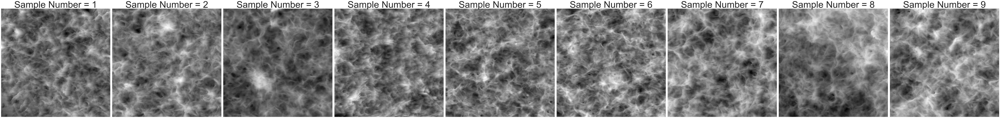

In [13]:
IPLOT.plotter(original)

-----------

## ``` Section 2: Performing Clustering ```

*The following section performs clustering of the scanned data using three types of data:*

1. *Vectorized data* ***(VD)***
2. *One Dimensional Fourier Transform Data* ***(1D-FFT)***
3. *Two Dimensional Fourier Transform Data* ***(2D-FFT)***

*The algorithms implemented within this iteration of the toolkit are as follows:*

*Algorithms that **do not require** tuning*
1. *K Means* 
2. *K Means ++* 
3. *K Means Bisect*
4. *Hierarchy (Agglometrive approach)*
5. *Fuzzy C Means*
6. *Spectral* 


*Algorithms that **REQUIRE** tuning*

7. *DBSCAN (Automated)*
8. *DBSCAN (Manual)*
9. *HDBSCAN* 
10. *Mean Shift* 
11. *OPTICS* 
12. *Affinity Propagation (Greedy approach)*
13. *BIRCH*


*All the algorithms have been tuned to obtain **Three clusters** as results that group the AFM data based on their size of scan area*

***1. Clustering Vectorized data (VD)***

In [271]:
T0_A1 = ALG.K_MEANS(data, 3) 
T0_A2 = ALG.K_MEANS_PLUS(data, 3)
T0_A3 = ALG.K_MEANS_BISECT(data, 3)
T0_A4 = ALG.HIERARCHY(data, 3, 0) # 0 or 1 to produce the Dendogram graph
T0_A5 = ALG.FUZZY_C(data, 3)
T0_A6 = ALG.SPECTRAL(data, 3)

T0_A7 = ALG.DBSCAN_AUTO(data, 2, 2)
T0_A8 = ALG.DBSCAN_MANUAL(data, 0.0001, 4)      
T0_A9 = ALG.HDBSCAN_MANUAL(data, 2, 2, 0)
T0_A10 = ALG.MEAN_SHIFT(data, 0.00013)
T0_A11 = ALG.OPTICS_AUTO(data, 2)     
T0_A12 = ALG.AFFINITY(data,0.96)
T0_A13 = ALG.BIRCH(TWO_Data, 2, 0.00001, 50)


***2. Clustering One Dimensional Fourier Transformed data (1D-FFT)***

In [177]:
T1_A1 = ALG.K_MEANS(ONE_Data[1], 3) 
T1_A2 = ALG.K_MEANS_PLUS(ONE_Data[1], 3)
T1_A3 = ALG.K_MEANS_BISECT(ONE_Data[1], 3)
T1_A4 = ALG.HIERARCHY(ONE_Data[1], 3, 0)
T1_A5 = ALG.FUZZY_C(ONE_Data[1], 3)
T1_A6 = ALG.SPECTRAL(ONE_Data[1], 3)


T1_A7 = ALG.DBSCAN_AUTO(ONE_Data[1], 2, 1)
T1_A8 = ALG.DBSCAN_MANUAL(ONE_Data[1], 2, 1)      
T1_A9 = ALG.HDBSCAN_MANUAL(ONE_Data[1], 2, 2, 0)
T1_A10 = ALG.MEAN_SHIFT(ONE_Data[1], 1.3)
T1_A11 = ALG.OPTICS_AUTO(ONE_Data[1], 2)     
T1_A12 = ALG.AFFINITY(ONE_Data[1], 0.95)
T1_A13 = ALG.BIRCH(TWO_Data, 3, 0.0001, 50)


***3. Clustering Two Dimensional Fourier Transformed data (2D-FFT)***

In [254]:
T2_A1 = ALG.K_MEANS(TWO_Data, 3) 
T2_A2 = ALG.K_MEANS_PLUS(TWO_Data, 3)
T2_A3 = ALG.K_MEANS_BISECT(TWO_Data, 3)
T2_A4 = ALG.HIERARCHY(TWO_Data, 3, 1)
T2_A5 = ALG.FUZZY_C(TWO_Data, 3)
T2_A6 = ALG.SPECTRAL(TWO_Data, 3)


T2_A7 = ALG.DBSCAN_AUTO(TWO_Data, 2, 1)
T2_A8 = ALG.DBSCAN_MANUAL(TWO_Data, 471, 2)      
T2_A9 = ALG.HDBSCAN_MANUAL(TWO_Data, 2, 1, 0)
T2_A10 = ALG.MEAN_SHIFT(TWO_Data, 464)
T2_A11 = ALG.OPTICS_AUTO(TWO_Data, 2)     
T2_A12 = ALG.AFFINITY(TWO_Data,0.95)
T2_A13 = ALG.BIRCH(TWO_Data, 3, 1, 3)


## ``` Section 3: Generation of Metrics ```

*The following section generates the metrics for the generated results using two groups of metrics:*

1. ***Ground truth based Metrics***
    - *Rand Index*
    - *Adjusted Rand Index*
    - *Adjujsted Mutual Information score* 
    - *Homogeneity* 
    - *Completness*
    - *V Measure*
    - *Geometric Mean*
    
    
2. ***Self Evaluatory Metrics***
    - *Silhoutte Score*
    - *Calinski Harabasz Score*
    - *Davies Boulin Index*



***1. Metrics for Clustered Vectorized data (VD)***

In [285]:
T0_A1_M1 =  MC_1.Metric_1(GD, T0_A1[1],"K MEANS")
T0_A1_M2 =  MC_2.Metric_2(data, T0_A1[1],"K MEANS")

T0_A2_M1 =  MC_1.Metric_1(GD, T0_A2[1],"K MEANS++")
T0_A2_M2 =  MC_2.Metric_2(data, T0_A2[1],"K MEANS++")

T0_A3_M1 =  MC_1.Metric_1(GD, T0_A3[1],"K MEANS BISECT")
T0_A3_M2 =  MC_2.Metric_2(data, T0_A3[1],"K MEANS BISECT")

T0_A4_M1 =  MC_1.Metric_1(GD, T0_A4[1],"HIERARCHY")
T0_A4_M2 =  MC_2.Metric_2(data, T0_A4[1],"HIERARCHY")

T0_A5_M1 =  MC_1.Metric_1(GD, T0_A5[1],"FUZZY_C")
T0_A5_M2 =  MC_2.Metric_2(data, T0_A5[1],"FUZZY_C")

T0_A6_M1 =  MC_1.Metric_1(GD, T0_A6[1],"SPECTRAL")
T0_A6_M2 =  MC_2.Metric_2(data, T0_A6[1],"SPECTRAL")

T0_A7_M1 =  MC_1.Metric_1(GD, T0_A7[1],"DBSCAN AUTO")
T0_A7_M2 =  MC_2.Metric_2(data, T0_A7[1],"DBSCAN AUTO")

T0_A8_M1 =  MC_1.Metric_1(GD, T0_A8[1],"DBSCAN MANUAL")
T0_A8_M2 =  MC_2.Metric_2(data, T0_A8[1],"DBSCAN MANUAL")

T0_A9[1][0] = 0 # Creation of OFFSET if all elements are included into the same cluster
T0_A9_M1 =  MC_1.Metric_1(GD, T0_A9[1],"HDBSCAN MANUAL")
T0_A9_M2 =  MC_2.Metric_2(data, T0_A9[1],"HDBSCAN MANUAL")

T0_A10_M1 =  MC_1.Metric_1(GD, T0_A10[1],"MEAN SHIFT")
T0_A10_M2 =  MC_2.Metric_2(data, T0_A10[1],"MEAN SHIFT")

T0_A11[1][0] = 1 # Creation of OFFSET if all elements are included into the same cluster
T0_A11_M1 =  MC_1.Metric_1(GD, T0_A11[1],"OPTICS AUTO")
T0_A11_M2 =  MC_2.Metric_2(data, T0_A11[1],"OPTICS AUTO")

T0_A12_M1 =  MC_1.Metric_1(GD, T0_A12[1],"AFFINITY")
T0_A12_M2 =  MC_2.Metric_2(data, T0_A12[1],"AFFINITY") 

T0_A13_M1 =  MC_1.Metric_1(GD, T0_A13[1],"BIRCH")
T0_A13_M2 =  MC_2.Metric_2(data, T0_A13[1],"BIRCH")


A_0_1 = pd.concat([T0_A1_M1[1],T0_A1_M2[1]], axis = 1)
A_0_2 = pd.concat([T0_A2_M1[1],T0_A2_M2[1]], axis = 1)
A_0_3 = pd.concat([T0_A3_M1[1],T0_A3_M2[1]], axis = 1)
A_0_4 = pd.concat([T0_A4_M1[1],T0_A4_M2[1]], axis = 1)
A_0_5 = pd.concat([T0_A5_M1[1],T0_A5_M2[1]], axis = 1)
A_0_6 = pd.concat([T0_A6_M1[1],T0_A6_M2[1]], axis = 1)
A_0_7 = pd.concat([T0_A7_M1[1],T0_A7_M2[1]], axis = 1)
A_0_8 = pd.concat([T0_A8_M1[1],T0_A8_M2[1]], axis = 1)
A_0_9 = pd.concat([T0_A9_M1[1],T0_A9_M2[1]], axis = 1)
A_0_10 = pd.concat([T0_A10_M1[1],T0_A10_M2[1]], axis = 1)
A_0_11 = pd.concat([T0_A11_M1[1],T0_A11_M2[1]], axis = 1)
A_0_12 = pd.concat([T0_A12_M1[1],T0_A12_M2[1]], axis = 1)
A_0_13 = pd.concat([T0_A13_M1[1],T0_A13_M2[1]], axis = 1)

Tab_VD = pd.concat([A_0_1,A_0_2,A_0_3,A_0_4,A_0_5,A_0_6,A_0_7,A_0_8,A_0_9, A_0_10, A_0_11, A_0_12, A_0_13])

***2. Metrics for Clustered One Dimensional Fourier Transformed data (1D-FFT)***

In [286]:
T1_A1_M1 =  MC_1.Metric_1(GD, T1_A1[1],"K MEANS")
T1_A1_M2 =  MC_2.Metric_2(ONE_Data[1], T1_A1[1],"K MEANS")

T1_A2_M1 =  MC_1.Metric_1(GD, T1_A2[1],"K MEANS++")
T1_A2_M2 =  MC_2.Metric_2(ONE_Data[1], T1_A2[1],"K MEANS++")

T1_A3_M1 =  MC_1.Metric_1(GD, T1_A3[1],"K MEANS BISECT")
T1_A3_M2 =  MC_2.Metric_2(ONE_Data[1], T1_A3[1],"K MEANS BISECT")

T1_A4_M1 =  MC_1.Metric_1(GD, T1_A4[1],"HIERARCHY")
T1_A4_M2 =  MC_2.Metric_2(ONE_Data[1], T1_A4[1],"HIERARCHY")

T1_A5_M1 =  MC_1.Metric_1(GD, T1_A5[1],"FUZZY_C")
T1_A5_M2 =  MC_2.Metric_2(ONE_Data[1], T1_A5[1],"FUZZY_C")

T1_A6_M1 =  MC_1.Metric_1(GD, T1_A6[1],"SPECTRAL")
T1_A6_M2 =  MC_2.Metric_2(ONE_Data[1], T1_A6[1],"SPECTRAL")

T1_A7_M1 =  MC_1.Metric_1(GD, T1_A7[1],"DBSCAN AUTO")
T1_A7_M2 =  MC_2.Metric_2(ONE_Data[1], T1_A7[1],"DBSCAN AUTO")

T1_A8_M1 =  MC_1.Metric_1(GD, T1_A8[1],"DBSCAN MANUAL")
T1_A8_M2 =  MC_2.Metric_2(ONE_Data[1], T1_A8[1],"DBSCAN MANUAL")

T1_A9_M1 =  MC_1.Metric_1(GD, T1_A9[1],"HDBSCAN MANUAL")
T1_A9_M2 =  MC_2.Metric_2(ONE_Data[1], T1_A9[1],"HDBSCAN MANUAL")

T1_A10_M1 =  MC_1.Metric_1(GD, T1_A10[1],"MEAN SHIFT")
T1_A10_M2 =  MC_2.Metric_2(ONE_Data[1], T1_A10[1],"MEAN SHIFT")

#T1_A11[1][0] = 1 # Creation of OFFSET if all elements are included into the same cluster
T1_A11_M1 =  MC_1.Metric_1(GD, T1_A11[1],"OPTICS AUTO")
T1_A11_M2 =  MC_2.Metric_2(ONE_Data[1], T1_A11[1],"OPTICS AUTO")

T1_A12_M1 =  MC_1.Metric_1(GD, T1_A12[1],"AFFINITY")
T1_A12_M2 =  MC_2.Metric_2(ONE_Data[1], T1_A12[1],"AFFINITY") 

T1_A13_M1 =  MC_1.Metric_1(GD, T1_A13[1],"BIRCH")
T1_A13_M2 =  MC_2.Metric_2(ONE_Data[1], T1_A13[1],"BIRCH")

A_1_1 = pd.concat([T1_A1_M1[1],T1_A1_M2[1]], axis = 1)
A_1_2 = pd.concat([T1_A2_M1[1],T1_A2_M2[1]], axis = 1)
A_1_3 = pd.concat([T1_A3_M1[1],T1_A3_M2[1]], axis = 1)
A_1_4 = pd.concat([T1_A4_M1[1],T1_A4_M2[1]], axis = 1)
A_1_5 = pd.concat([T1_A5_M1[1],T1_A5_M2[1]], axis = 1)
A_1_6 = pd.concat([T1_A6_M1[1],T1_A6_M2[1]], axis = 1)
A_1_7 = pd.concat([T1_A7_M1[1],T1_A7_M2[1]], axis = 1)
A_1_8 = pd.concat([T1_A8_M1[1],T1_A8_M2[1]], axis = 1)
A_1_9 = pd.concat([T1_A9_M1[1],T1_A9_M2[1]], axis = 1)
A_1_10 = pd.concat([T1_A10_M1[1],T1_A10_M2[1]], axis = 1)
A_1_11 = pd.concat([T1_A11_M1[1],T1_A11_M2[1]], axis = 1)
A_1_12 = pd.concat([T1_A12_M1[1],T1_A12_M2[1]], axis = 1)
A_1_13 = pd.concat([T1_A13_M1[1],T1_A13_M2[1]], axis = 1)

Tab_1D = pd.concat([A_1_1,A_1_2,A_1_3,A_1_4,A_1_5,A_1_6,A_1_7,A_1_8,A_1_9, A_1_10, A_1_11, A_1_12, A_1_13])

***3. Metrics for Clustered Two Dimensional Fourier Transformed data (2D-FFT)***

In [288]:
T2_A1_M1 =  MC_1.Metric_1(GD, T2_A1[1],"K MEANS")
T2_A1_M2 =  MC_2.Metric_2(data, T2_A1[1],"K MEANS")

T2_A2_M1 =  MC_1.Metric_1(GD, T2_A2[1],"K MEANS++")
T2_A2_M2 =  MC_2.Metric_2(data, T2_A2[1],"K MEANS++")

T2_A3_M1 =  MC_1.Metric_1(GD, T2_A3[1],"K MEANS BISECT")
T2_A3_M2 =  MC_2.Metric_2(data, T2_A3[1],"K MEANS BISECT")

T2_A4_M1 =  MC_1.Metric_1(GD, T2_A4[1],"HIERARCHY")
T2_A4_M2 =  MC_2.Metric_2(data, T2_A4[1],"HIERARCHY")

T2_A5_M1 =  MC_1.Metric_1(GD, T2_A5[1],"FUZZY_C")
T2_A5_M2 =  MC_2.Metric_2(data, T2_A5[1],"FUZZY_C")

T2_A6_M1 =  MC_1.Metric_1(GD, T2_A6[1],"SPECTRAL")
T2_A6_M2 =  MC_2.Metric_2(data, T2_A6[1],"SPECTRAL")

T2_A7_M1 =  MC_1.Metric_1(GD, T2_A7[1],"DBSCAN AUTO")
T2_A7_M2 =  MC_2.Metric_2(data, T2_A7[1],"DBSCAN AUTO")

T2_A8_M1 =  MC_1.Metric_1(GD, T2_A8[1],"DBSCAN MANUAL")
T2_A8_M2 =  MC_2.Metric_2(data, T2_A8[1],"DBSCAN MANUAL")

T2_A9_M1 =  MC_1.Metric_1(GD, T2_A9[1],"HDBSCAN MANUAL")
T2_A9_M2 =  MC_2.Metric_2(data, T2_A9[1],"HDBSCAN MANUAL")

T2_A10[1][0] = 1 # Creation of OFFSET if all elements are included into the same cluster
T2_A10_M1 =  MC_1.Metric_1(GD, T2_A10[1],"MEAN SHIFT")
T2_A10_M2 =  MC_2.Metric_2(data, T2_A10[1],"MEAN SHIFT")

#T2_A11[1][0] = 1 # Creation of OFFSET if all elements are included into the same cluster
T2_A11_M1 =  MC_1.Metric_1(GD, T2_A11[1],"OPTICS AUTO")
T2_A11_M2 =  MC_2.Metric_2(data, T2_A11[1],"OPTICS AUTO")

T2_A12_M1 =  MC_1.Metric_1(GD, T2_A12[1],"AFFINITY")
T2_A12_M2 =  MC_2.Metric_2(data, T2_A12[1],"AFFINITY") 

T2_A13_M1 =  MC_1.Metric_1(GD, T2_A13[1],"BIRCH")
T2_A13_M2 =  MC_2.Metric_2(data, T2_A13[1],"BIRCH")

A_2_1 = pd.concat([T2_A1_M1[1],T2_A1_M2[1]], axis = 1)
A_2_2 = pd.concat([T2_A2_M1[1],T2_A2_M2[1]], axis = 1)
A_2_3 = pd.concat([T2_A3_M1[1],T2_A3_M2[1]], axis = 1)
A_2_4 = pd.concat([T2_A4_M1[1],T2_A4_M2[1]], axis = 1)
A_2_5 = pd.concat([T2_A5_M1[1],T2_A5_M2[1]], axis = 1)
A_2_6 = pd.concat([T2_A6_M1[1],T2_A6_M2[1]], axis = 1)
A_2_7 = pd.concat([T2_A7_M1[1],T2_A7_M2[1]], axis = 1)
A_2_8 = pd.concat([T2_A8_M1[1],T2_A8_M2[1]], axis = 1)
A_2_9 = pd.concat([T2_A9_M1[1],T2_A9_M2[1]], axis = 1)
A_2_10 = pd.concat([T2_A10_M1[1],T2_A10_M2[1]], axis = 1)
A_2_11 = pd.concat([T2_A11_M1[1],T2_A11_M2[1]], axis = 1)
A_2_12 = pd.concat([T2_A12_M1[1],T2_A12_M2[1]], axis = 1)
A_2_13 = pd.concat([T2_A13_M1[1],T2_A13_M2[1]], axis = 1)


Tab_2D = pd.concat([A_2_1,A_2_2,A_2_3,A_2_4,A_2_5,A_2_6,A_2_7,A_2_8,A_2_9, A_2_10, A_2_11, A_2_12, A_2_13])

In [293]:
# uncomment to export to CSV files in present location 
# os.getcwd() - provides the current working directory where the files are saved

Tab_VD.to_csv("Case-3_Pool_3_VD_Data_simulated.csv")
Tab_1D.to_csv("Case-3_Pool_3_1D_Data_simulated.csv")
Tab_2D.to_csv("Case-3_Pool_3_2D_Data_simulated.csv")

## ``` Section 4: Generation of Plots & Results```

*The following section generates the bar graphs for the generated results & metrics. We have selected Rand Index to be plotted for the bar graph*

In [290]:
DG_R = []
DG_1 = []
DG_2 = []

for i in range(len(list(Tab_VD[Tab_VD.columns[0]]))):
    DG_R.append(float(list(Tab_VD[Tab_VD.columns[0]])[i]))
    DG_1.append(float(list(Tab_1D[Tab_1D.columns[0]])[i]))
    DG_2.append(float(list(Tab_2D[Tab_2D.columns[0]])[i]))
    
indexes = ['K Means', 'K Means++', 'K Means Bisect', 'Hierarchy', 'Fuzzy_C', 'Spectral', 'DBSCAN Auto',
           'DBSCAN Man', 'HDBSCAN Man', 'Mean Shift', 'Optics Auto','Affinity', 'Birch'] 

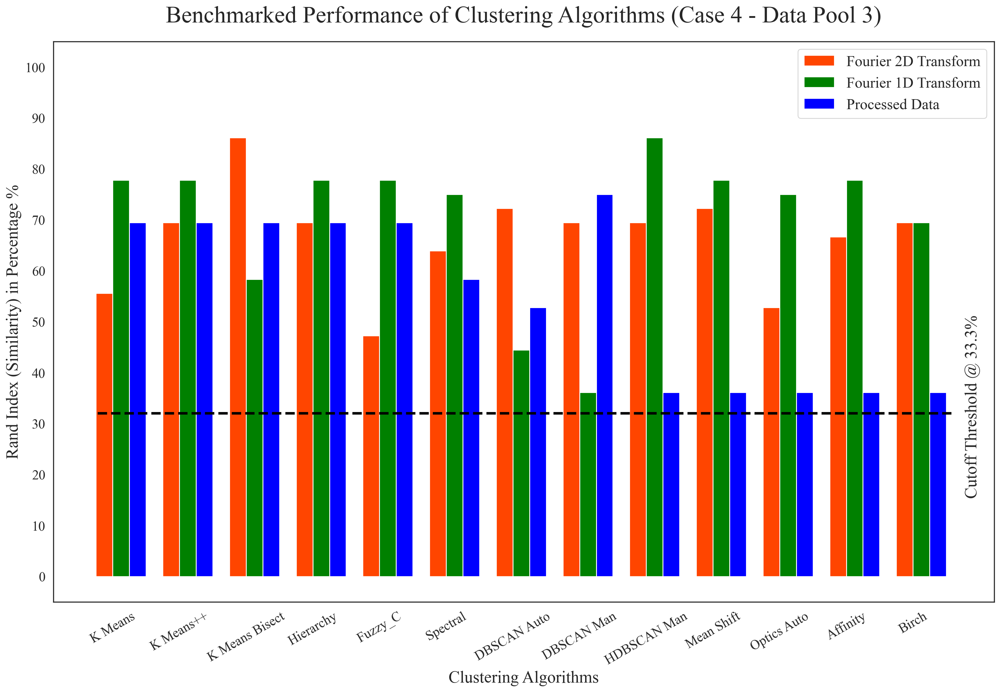

In [298]:
s = []
d = []
for i in range(14):
    s.append(i)
    d.append(32)
s[0] = -0.1
s[13] = 12.7

sns.set(style="white")
plt.rcParams["font.family"] = "Times New Roman"
rcParams['axes.titlepad'] = 16 
mpl.rcParams['figure.dpi'] = 100

N = 13          
ind = np.arange(N)
width = 0.25
fig = plt.figure(figsize=(20, 12), dpi = 200) 

xvals = DG_2
bar1 = plt.bar(ind, xvals, width, color = 'orangered')
yvals = DG_1
bar2 = plt.bar(ind+width, yvals, width, color='green')
zvals = DG_R
bar3 = plt.bar(ind+width*2, zvals, width, color = 'blue')
plt.plot(s,d, ls='--', c='black', lw = 3) 
plt.text(12.9,16, 'Cutoff Threshold @ 33.3%',rotation = 90, fontsize = 20) 

plt.xlabel("Clustering Algorithms",  fontsize = 20)#fontweight = 'bold',
plt.ylabel("Rand Index (Similarity) in Percentage %",fontsize = 20) #fontweight='bold',


plt.title("Benchmarked Performance of Clustering Algorithms (Case 4 - Data Pool 3)",fontsize = 28,y=1.01)
plt.xticks(ind + width/2, indexes, rotation = 30, fontsize = 16)
plt.ylim(-5,105)
plt.yticks(range(0,105,10),fontsize = 16)

plt.legend( (bar1, bar2, bar3), ('Fourier 2D Transform', 'Fourier 1D Transform', 'Processed Data'), fontsize=18, loc='upper right')

plt.savefig("Accuracy Comparison",bbox_inches='tight')
plt.show()


``` *The following part generates visualization of the final clustered results via K Means ++ algorithim*```

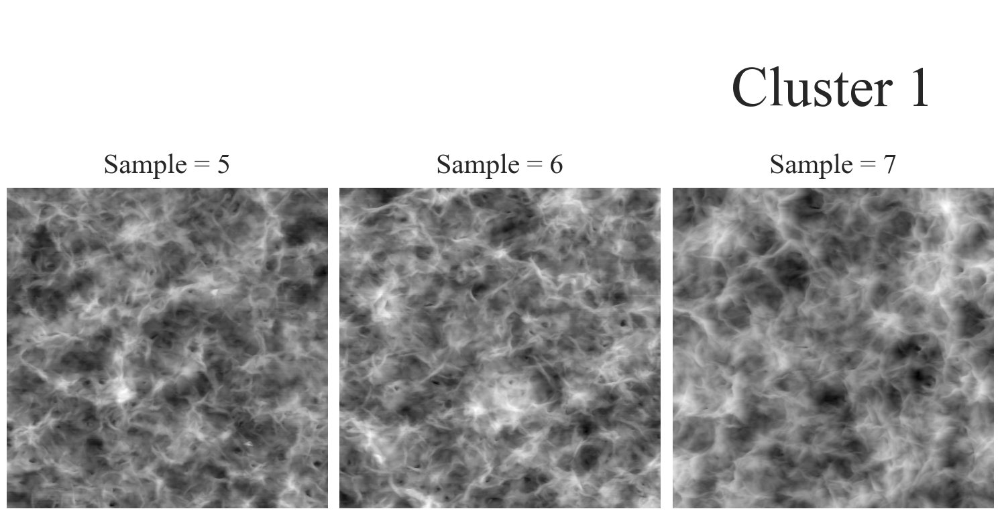

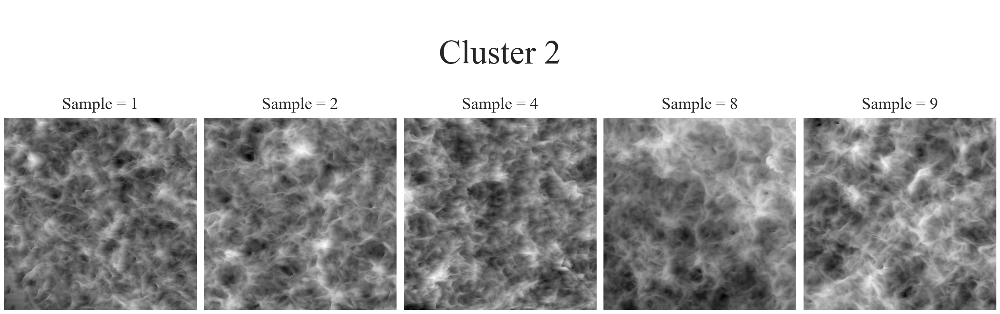

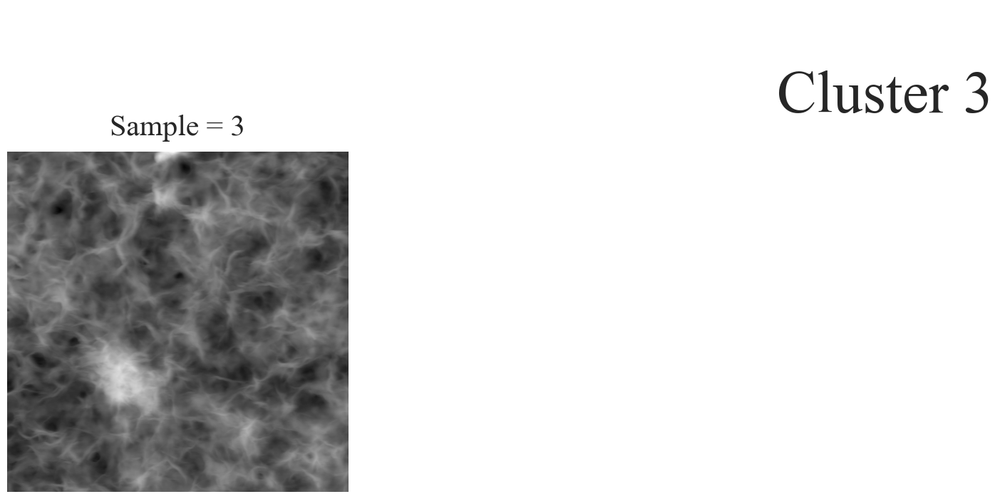

In [299]:
FPLOT.plotter_2(T2_A1[0], original)

*----------------------------------------------------------------------------------------------------- END -----------------------------------------------------------------------------------------------------*